### Import knihoven a konfigurace

In [1]:
from improutils import *

import os
import io

import cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
np.set_printoptions(formatter={'float': lambda x: "{0:0.3f}".format(x)})

## Úkol

Výchozím bodem k tomuto úkolu je [cvičení na perspektivní transformaci](https://courses.fit.cvut.cz/BI-SVZ/tutorials/files/6/perspective-measuring-length.html).

### První část - rovnání dokumentu a následná aplikace OCR
Práce probíhá se souborem `ocr_img.jpg` na kterém se nachází dokument známých rozměrů (papír A4). Dokument je potřeba transformovat na kolmý pohled a následně využít OCR k automatizovanému přečtení textu. Za tuto část je možné získat maximálně **3 body** a **až 1 prémiový**.

![](data/image/ocr_img.jpg)

**1) Načtěte obrázek, zobrazte ho a uložte si pole cílových korespondečních souřadnic rohů dokumentu.**

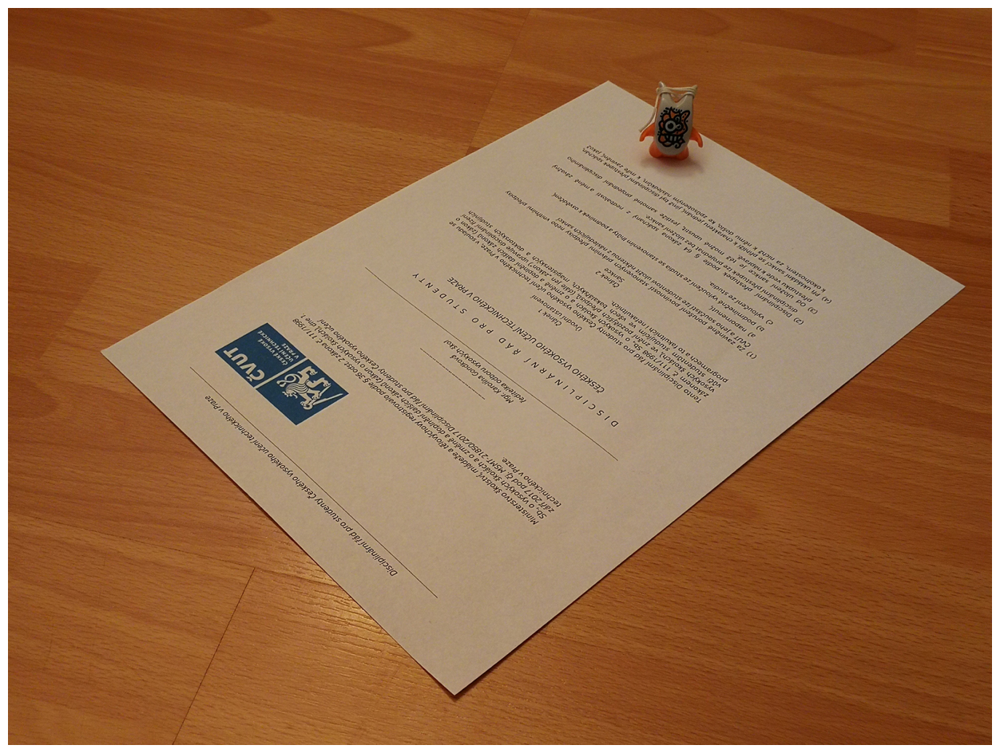

In [2]:
image = load_image('data/image/ocr_img.jpg')
plot_images(image)

In [3]:
real_world_pts = np.array([[0, 0], [0, 2970], [2100, 0], [2100, 2970]], dtype=np.float32)

**2) Pomocí oblíbeného grafického editoru vyberte obrazové souřadnice rohů dokumentu ve snímku.**  
Souřadnice musí korespondovat pořadím, takže pokud je levý roh první v předchozím poli, musí být první vybrán i v tomto kroku.

**Bonusová úloha č. 2 - následoval jsem postupně jednotlivé kroky z nápovědy**

In [4]:
image_gray = to_gray(image)

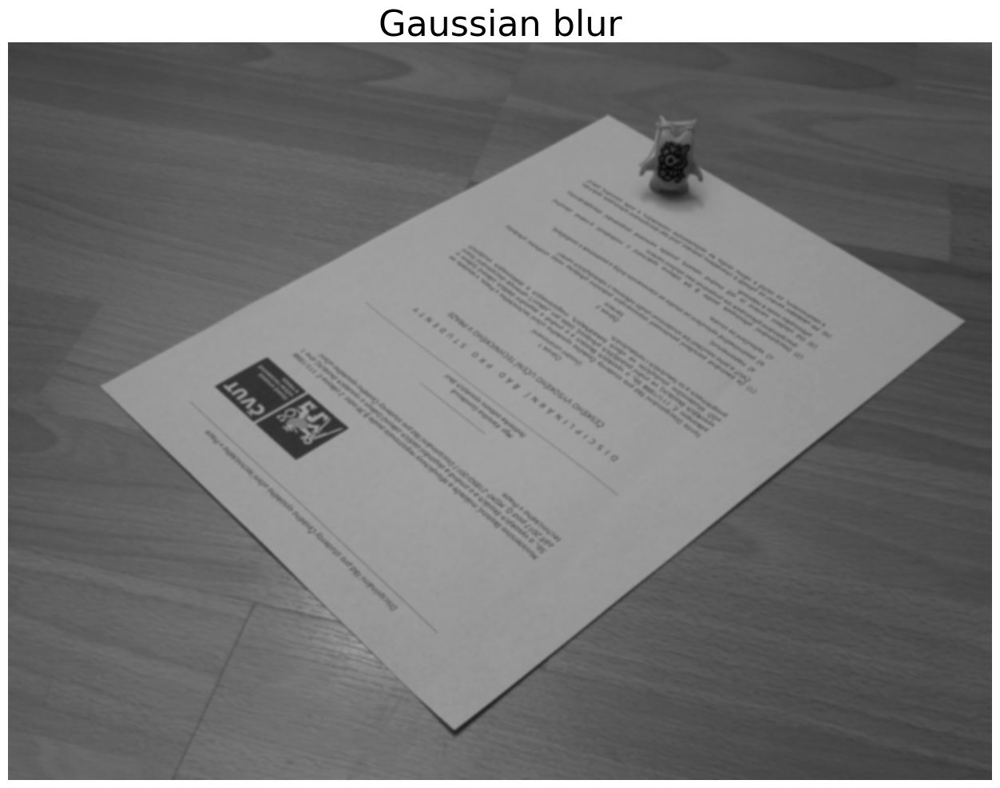

In [5]:
gaussian = cv2.GaussianBlur(image_gray,(11, 11),0)
plot_images(gaussian, titles=['Gaussian blur'])

In [38]:
from ipywidgets import interact, IntSlider
import matplotlib.pyplot as plt
import cv2


def adjust_thresholds_rect_ref(lower_t, upper_t):
    mask = cv2.Canny(gaussian, lower_t, upper_t)
    plt.figure(figsize=(20, 10))
    plt.imshow(mask, cmap='gray')
    plt.axis('off')
    plt.show()

interact(adjust_thresholds_rect_ref,
         lower_t=IntSlider(min=0, max=255, value=20, description='Lower Threshold'),
         upper_t=IntSlider(min=0, max=255, value=220, description='Upper Threshold'));


interactive(children=(IntSlider(value=20, description='Lower Threshold', max=255), IntSlider(value=220, descri…

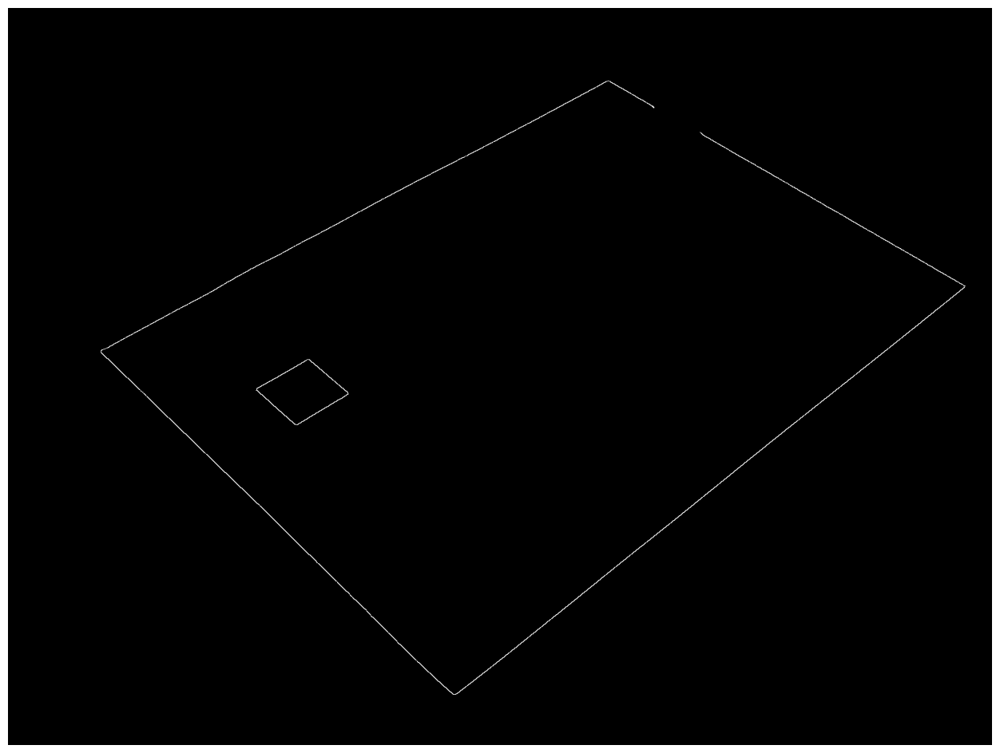

In [8]:
t_lower = 53
t_upper = 255

canny = cv2.Canny(gaussian, t_lower, t_upper)

plot_images(canny)

In [9]:
contours, hierarchy = cv2.findContours(canny, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
image_cnt = image.copy()

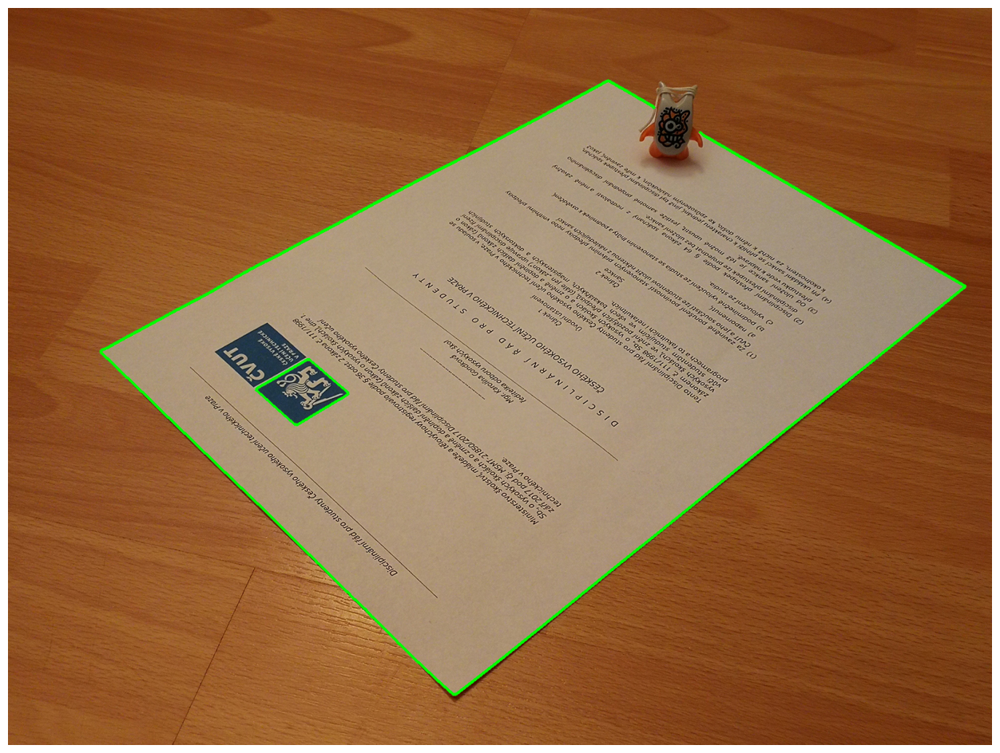

In [10]:
cv2.drawContours(image_cnt, contours, -1, (0, 255, 0), 3)
plot_images(image_cnt)

In [11]:
largest_contour = max(contours, key=lambda cnt: cv2.contourArea(cv2.convexHull(cnt)))
largest_contour = cv2.convexHull(largest_contour)

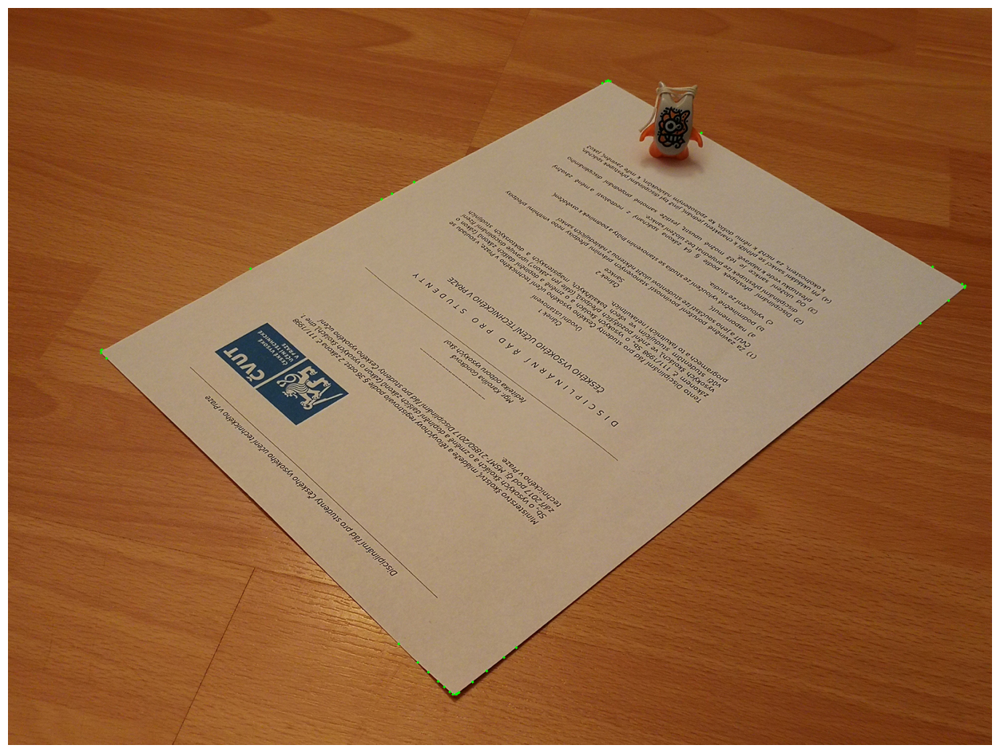

In [12]:
image_cnt2 = image.copy()
cv2.drawContours(image_cnt2, largest_contour, -1, (0, 255, 0), 3)
plot_images(image_cnt2)

In [13]:
epsilon = 0.005*cv2.arcLength(largest_contour,True)
approx = cv2.approxPolyDP(largest_contour,epsilon,True)

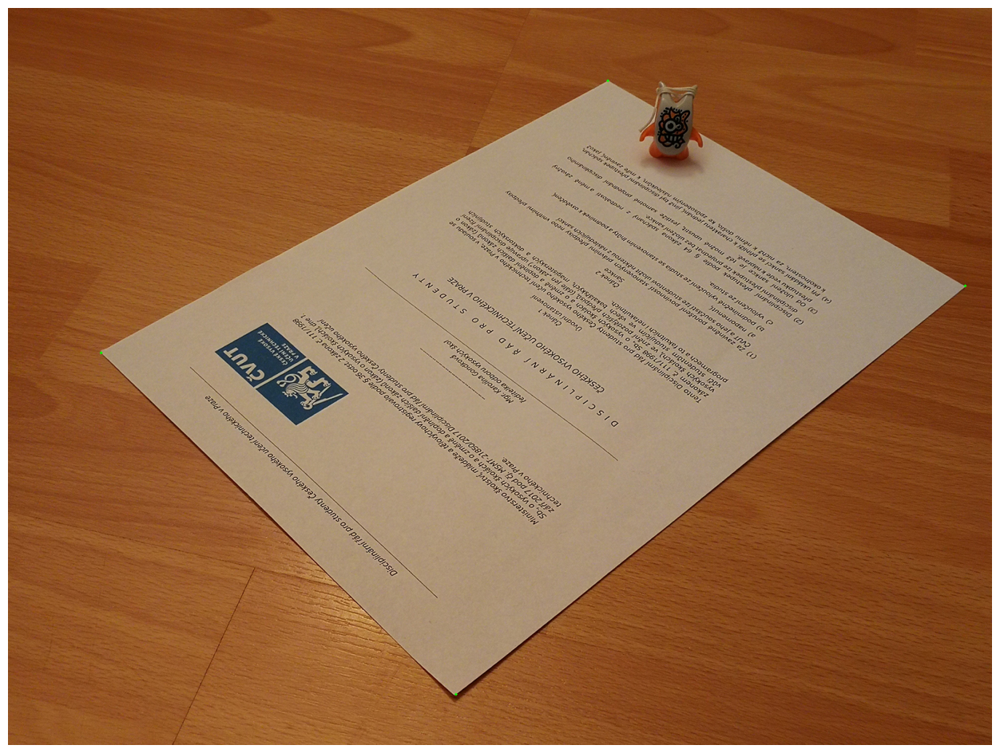

In [39]:
image_cnt2 = image.copy()
cv2.drawContours(image_cnt2, approx, -1, (0, 255, 0), 3)
plot_images(image_cnt2)

In [15]:
points = approx.reshape(-1, 2)

In [16]:
centroid_x = int(np.mean(points[:, 0]))
centroid_y = int(np.mean(points[:, 1]))

centroid = [centroid_x, centroid_y]

In [17]:
def sortByAngle(point):
    return np.arctan2(*(point-centroid))

points = list(points)

points.sort(key=sortByAngle)

**Pro výpočet vzdálenosti využiji mojí funkci z prvního úkolu:**

In [19]:
import numpy as np

def line_segment_to_point_dist(l_pt1, l_pt2, dst_pt):
    x1, y1 = l_pt1
    x2, y2 = l_pt2
    x3, y3 = dst_pt

    # Směrový vektor úsečky
    dx = x2 - x1
    dy = y2 - y1

    # Pokud je úsečka bod (degenerovaný případ)
    if dx == 0 and dy == 0:
        return np.hypot(x3 - x1, y3 - y1)

    # Projekce bodu na přímku
    t = ((x3 - x1) * dx + (y3 - y1) * dy) / (dx * dx + dy * dy)

    # Omezení t do intervalu [0, 1] pro zachování projekce na úsečce
    t = max(0, min(1, t))

    # Výpočet projekčního bodu na úsečce
    closest_x = x1 + t * dx
    closest_y = y1 + t * dy

    # Vzdálenost od dst_pt k nejbližšímu bodu na úsečce
    distance = np.hypot(x3 - closest_x, y3 - closest_y)

    return distance

In [20]:
distances = []

n = len(points)
for i in range(n):
    left = (i - 1) % n
    mid = i
    right = (i + 1) % n

    distance = line_segment_to_point_dist(points[left], points[right], points[mid])
    distances.append([distance, points[mid]])

In [21]:
def sortFnc(el):
        return el[0]

distances.sort(key=sortFnc, reverse=True)

In [23]:
max_distance_pts = []

for el in distances[:4]:
    max_distance_pts.append(el[1])


In [24]:
image_pts2 = np.array(max_distance_pts)

format: x, y 
 [[ 151  561]
 [1556  452]
 [ 728 1117]
 [ 975  118]]


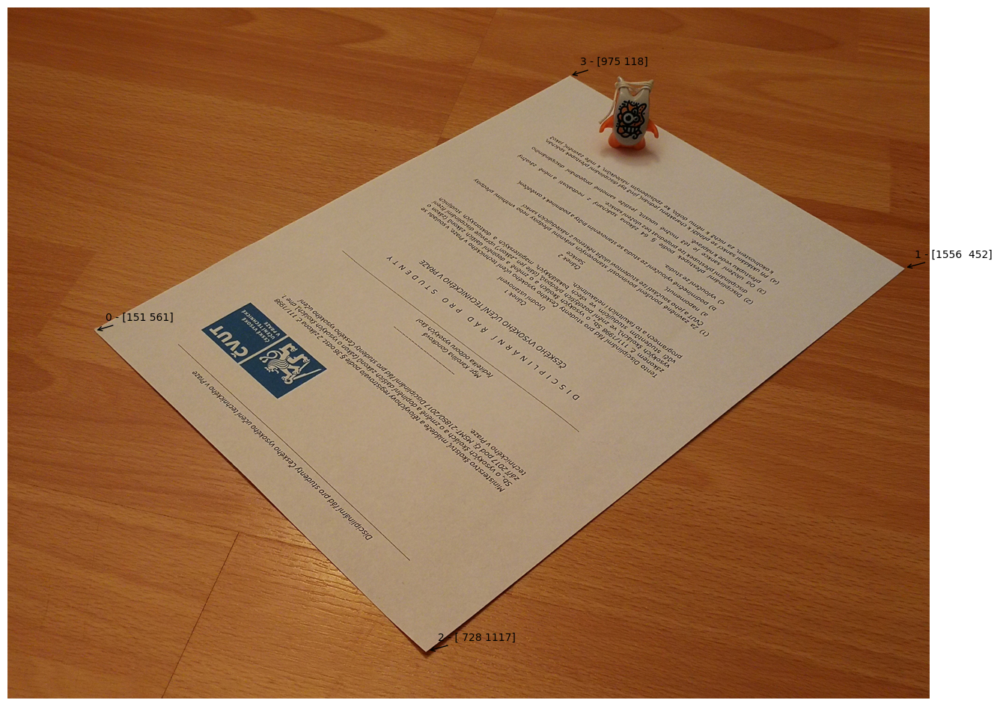

In [26]:
# image_pts jsou body získané pomocí grafického editoru Gimp
# image_pts = np.array([[726, 1122], [1557, 455], [152, 559], [977, 120]], dtype=np.float32)

if (len(image_pts) != len(real_world_pts)):
    raise ValueError('Real world points and image points must be the same size.')

print('format: x, y \n', image_pts2)

plot_images(image)
for i, pt in enumerate(image_pts2):
    plt.annotate(str(i) + " - " + str(pt), xy=pt, textcoords="offset points", xytext=(10,10), arrowprops=dict(arrowstyle="->"))

**3) Vypočtěte transformační matici H, vypište její tvar.**

In [27]:
H,_ = cv2.findHomography(image_pts, real_world_pts)
print(H)

[[-2.219 -2.764 4712.166]
 [2.459 -2.507 1027.769]
 [-0.000 0.001 1.000]]


**4) Popište rozdíl mezi [`cv2.getPerspectiveTransform()`](https://docs.opencv.org/3.4.1/da/d54/group__imgproc__transform.html#ga8c1ae0e3589a9d77fffc962c49b22043) a [`cv2.findHomography`](https://docs.opencv.org/3.4.1/d9/d0c/group__calib3d.html#ga4abc2ece9fab9398f2e560d53c8c9780).**

- `cv2.getPerspectiveTransform()` - Počítá transformační matici na základě čtyř odpovídajících bodů v původním a cílovém obrázku
- `cv2.findHomography` - Hledá perspektivní transformaci mezi dvěma rovinami (může pracovat s libovolným počtem odpovídajících bodů -> min. 4), robustnější

**5) Využijte funkci [`cv2.warpPerspective`](https://docs.opencv.org/3.4.1/da/d54/group__imgproc__transform.html#gaf73673a7e8e18ec6963e3774e6a94b87) k vytvoření kolmého pohledu dokumentu, výsledek zobrazte a uložte.**

In [29]:
warped_img = cv2.warpPerspective(image, H, (2100, 2970))

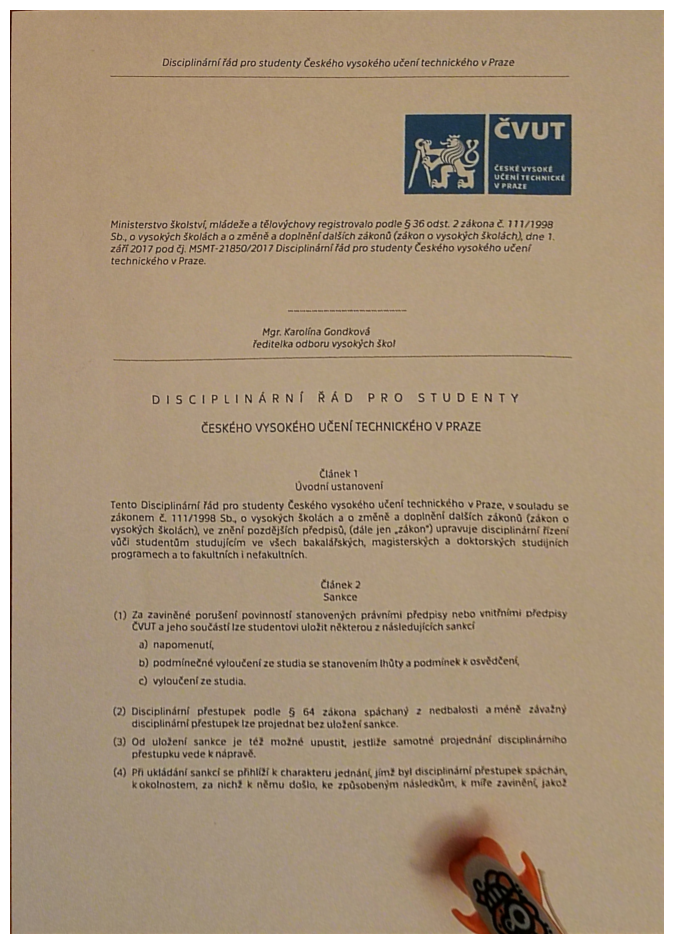

In [30]:
plot_images(warped_img)

**6) Segmentujte text z "narovnaného" obrázku**
Vyberte vhodnou segmentační funkci z [modulu segmentation v improutils](https://gitlab.fit.cvut.cz/bi-svz/improutils_package/-/blob/master/improutils/segmentation/segmentation.py).

In [31]:
gray = to_gray(warped_img)

In [37]:
from ipywidgets import interact, IntSlider

def adjust_thresholds_rect_ref(lower_t, upper_t):
    mask = segmentation_two_thresholds(gray, lower_t, upper_t)
    plt.figure(figsize=(20, 10))
    plt.imshow(mask, cmap='gray')
    plt.axis('off')
    plt.show()

interact(adjust_thresholds_rect_ref,
         lower_t=IntSlider(min=0, max=255, value=20, description='Lower Threshold'),
         upper_t=IntSlider(min=0, max=255, value=220, description='Upper Threshold'));


interactive(children=(IntSlider(value=20, description='Lower Threshold', max=255), IntSlider(value=220, descri…

In [33]:
img_bin = segmentation_two_thresholds(gray, 135, 0)

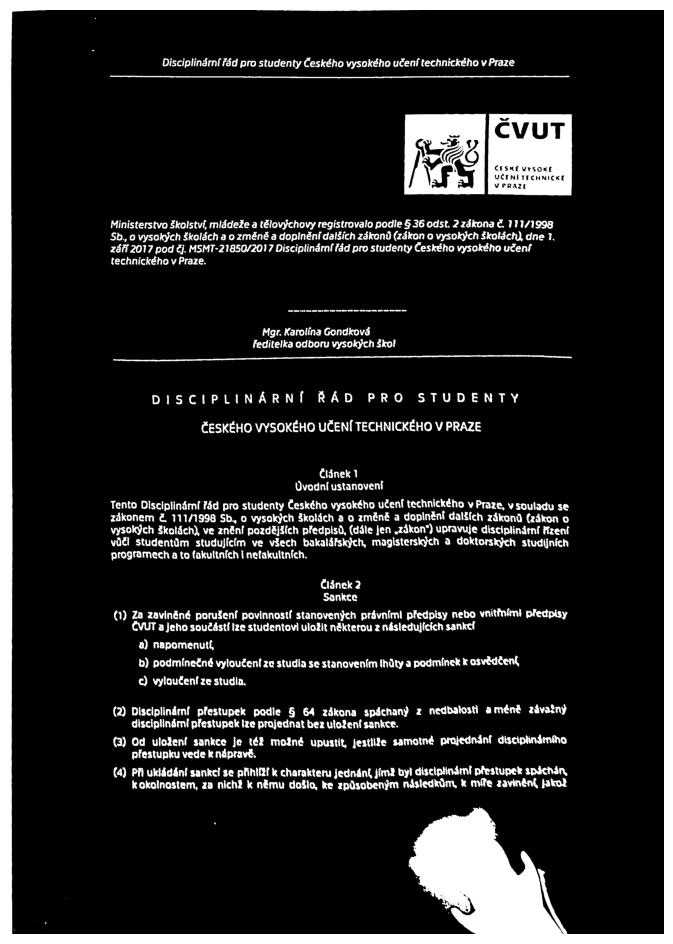

In [34]:
plot_images(img_bin)

**7) Detekujte text na "narovnaném" obraze, text vypište a uložte do textového souboru.**

Pro detekci využijte funkci [ocr](https://gitlab.fit.cvut.cz/bi-svz/improutils_package/-/blob/master/improutils/recognition/ocr.py#L7).

In [35]:
text = ocr(img_bin, lang="ces")

In [36]:
print(text)

Disciplinární řád pro studenty Českého vysokého učení technického v Praze

ČESKÉ VYSOKÉ
UČENÍ TECHNICKÉ
K ZV8i

 

Ministerstvo Školství mládeže a tělovýchovy registrovalo podle 5 36 odst. 2 zákona č. 111/1998
Sb., o vysokých školách a o změně a doplnění dalších zákonů (zákon o vysokých školách), dne 1.
září 2017 pod čj. MSMT-21850/2017 Disciplinární řád pro studenty Českého vysokého učení
technického v Praze.

K ré m 0 m 0 0 000

Mgr. Karolína Gondková
ředitelka odboru vysokých škol
r

DISCIPLINÁRNÍ ŘÁD PRO STUDENTY
ČESKÉHO VYSOKÉHO UČENÍ TECHNICKÉHO V PRAZE

Číšnek 1
Úvodní ustanovení

Tento Disciplinární řád pro studenty Českého vysokého učení technického v Praze, v souladu se
zákonem č, 111/1998 Sb, o vysokých školách a o změně a doplnění dalších zákonů (zákon o
vysokých školách), ve znění pozdějších předpisů, (dále jen „zákon“) upravuje disciplinární řízení
vůči studentům studujícím ve všech bakalářských, magisterských a doktorských studijních
programech a to fakultních | nefakult

#### Bonus k první části
Jak je vidět, výsledky po aplikaci OCR nejsou zcela uspokojivé. Je však v nutné brát potaz, že vstupní obraz není kromě geometrické transformace nijak dále předzpracován.

**8) Pokuste se vstupní obraz před aplikací OCR kvalitněji předzpracovat pomocí probíraných technik - crop, segmentace, zaostření, rozmazání, jas, kontrast, apod. Fantazii se meze nekladou. Stručně diskutujte poznatky a vlivy jednotlivých operací na výslednou kvalitu. <span style="color:blue">(0.5 bodu)</span>**


**9) Upravte krok 2) tak, aby souřadnice rohů papíru byly detekovány automaticky. <span style="color:blue">(1 bod)</span>**

Pro zobrazení nápovědy rozklikněte tohle markdown pole.
<!-- 

Hints: 
PLOT EACH STEP, it really helps!

-> gaussian blur
-> canny
-> findContours(RETR_EXTERNAL, CHAIN_APPROX_SIMPLE)
-> find largest contour by contourArea(converHull(contour)) since the FIT logo will likely be detected as a contour
-> approxPolyDP(contour, eps)
-> simplify poly approximation down to 4 points:

Find centroid of points (average of points), 
sort points by their angle: np.arctan2(*(point-centroid).

Iterate over points, always keeping track of 2 neighbouring points.

Calculate distance of middle point from the line connecting its neighbouring points.

 left = (i-1)%n 
 mid = i  
 right = (i+1) % n
 __________________________________
| left                 right      |
|  x--------------------x         |
|            ^                    |
|            |                    |
|            | distance           |
|            x                    |
|           mid                   |
|_________________________________|

Find 4 points with the largest distance. 
The idea is, that if the distance is small, the 3 points are likely on a single line.
Therefore the midpoint can be omitted.

Points with large distance are likely corners of the paper.

-> The 4 points can now be rotated, np.roll can be helpful in this case.
-> Good job, you're basically a computer vision wizard at this point!

-->

### Pokusil jsem se o druhý bonusový úkol, vizte. krok č. 2 ###